<a href="https://colab.research.google.com/github/AdinGarbowit/Prob-and-Stats--AG/blob/main/Notes_Hahn_Math_24_Lab_7_A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Never Say Never - Documentary on Belousov–Zhabotinsky Reaction BZ

https://www.youtube.com/watch?v=FvXwVZPOoBI


Image Kernels Explained Visually

https://setosa.io/ev/image-kernels/

In [ ]:
#Necessary imports for convolutions of images
import numpy as np #mathematical functions
from skimage import io as io #image processing
import matplotlib.pyplot as plt #plotting
from scipy import signal #convolution
import torch.nn.functional as F #tensor manipulations like cross-entropy
from torch.nn.functional import * #softmax and convolution functions
import torch #tensors
import torch.nn as nn #loss functions and neural network layers
import torchvision #datasets and image manipulation capabilities
import torchvision.transforms as transforms #image transformation
import time #measures time
from matplotlib import animation, rc #allows for animation capabilties
from IPython.display import HTML #text display
rc('animation', html='html5') #displays animations in html5 format

In [ ]:
def make_ani(A, colormap='gray'): #function to make animation of some variable A in a grayscale color map

    fig, ax = plt.subplots() #defines the subplots for the function
    im = ax.imshow(A[0,:,:], cmap = colormap); #defines im as the first image of A
    ax.axis('off') #turns off the axis display
    fig.set_size_inches(12, 12) #sets image size to 12 inches by 12 inches

    def animate(data, im): #animation function
        im.set_data(data) #sets the data of im equal to the data that will be defined below

    def step(): #defining data
        for i in range(A.shape[0]): #repeats the process below for as many times as the shape of A
            data = A[i,:,:] #data is equal to the images in A repeated until there are no more images in A
            yield data #returns all the components of data

    return animation.FuncAnimation(fig, animate, step, interval=100, repeat=True, fargs=(im,)) #returns the animation as a repeating figure

In [ ]:
def plot(x): #creating a plot function
    fig, ax = plt.subplots() #the figure and axis are being defined as the subplots function (sets up the plotting environment)
    im = ax.imshow(x,cmap='gray') #cmap = gray makes the colorscale gray
    ax.axis('off') #sets it so an axis does not appear in the plot
    fig.set_size_inches(20, 20) #sets the figure size to 20 inches by 20 inches
    plt.show() #displays plot when function is called

In [ ]:
image = io.imread("https://www.filfre.net/wp-content/uploads/2013/12/bbc4.png") #image is defined as reading the url of a png of a game display

In [ ]:
image.shape #Returns the shape of the above image (512x640 with 3 color channels)

(512, 640, 3)

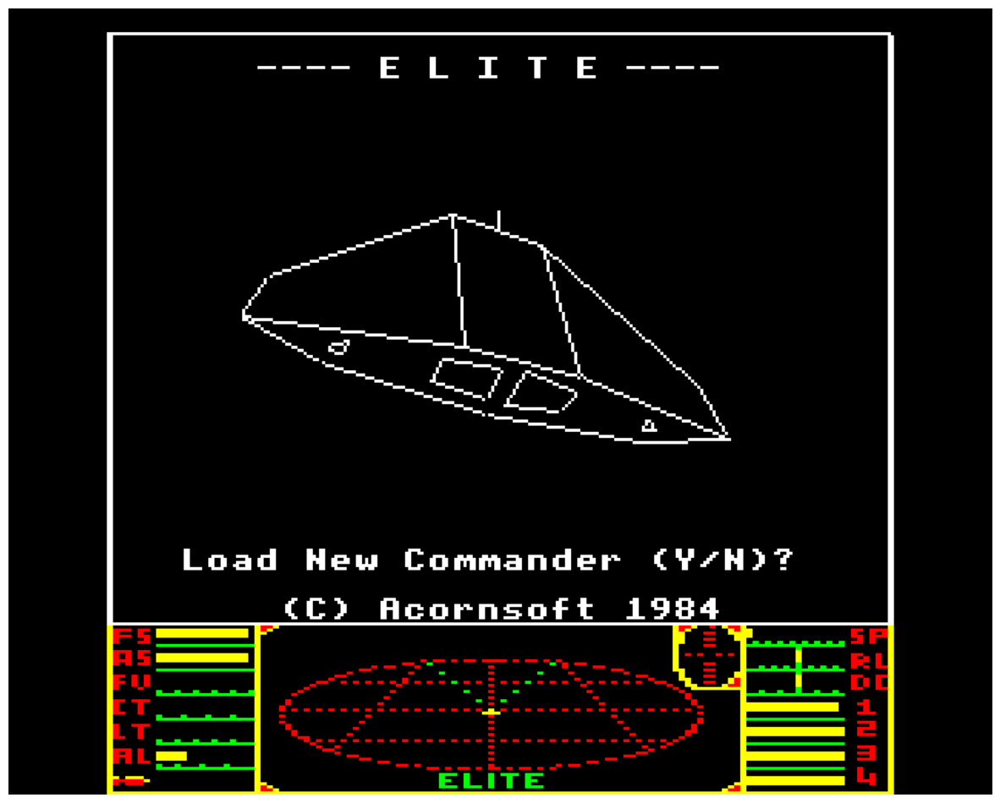

In [ ]:
plot(image) #plots the image using the created plot function

In [ ]:
image.shape #returns the shape of the image again

(512, 640, 3)

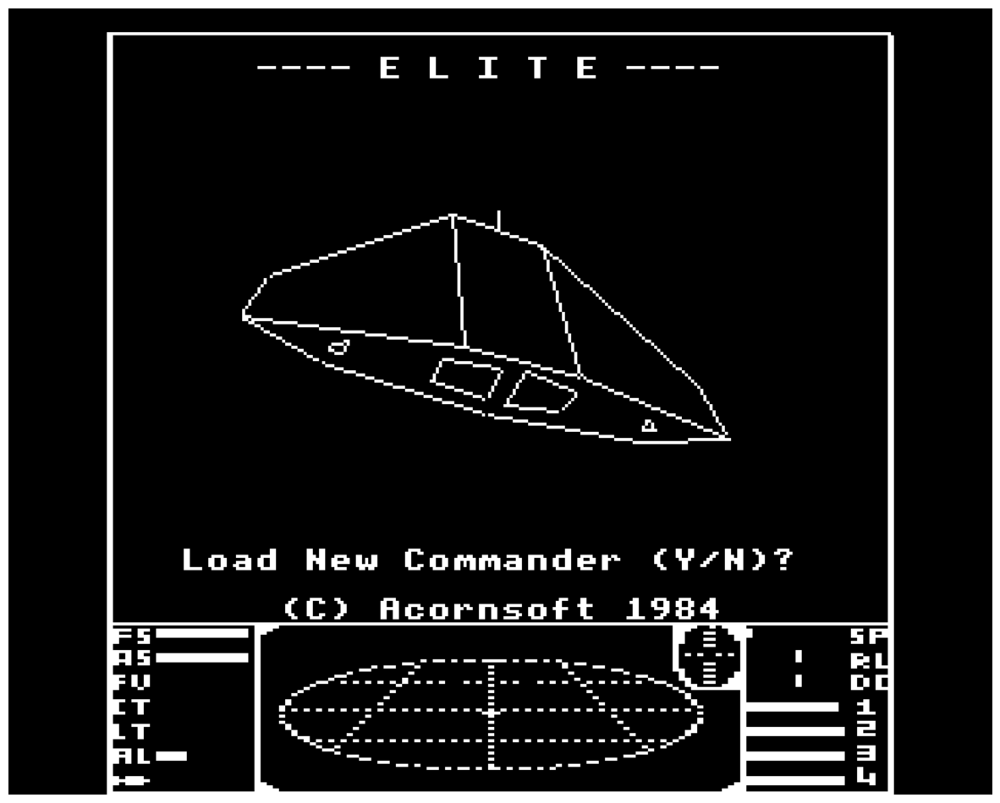

In [ ]:
plot(image[:,:,0]) #plots the image, but this time, only with the red color channel being called

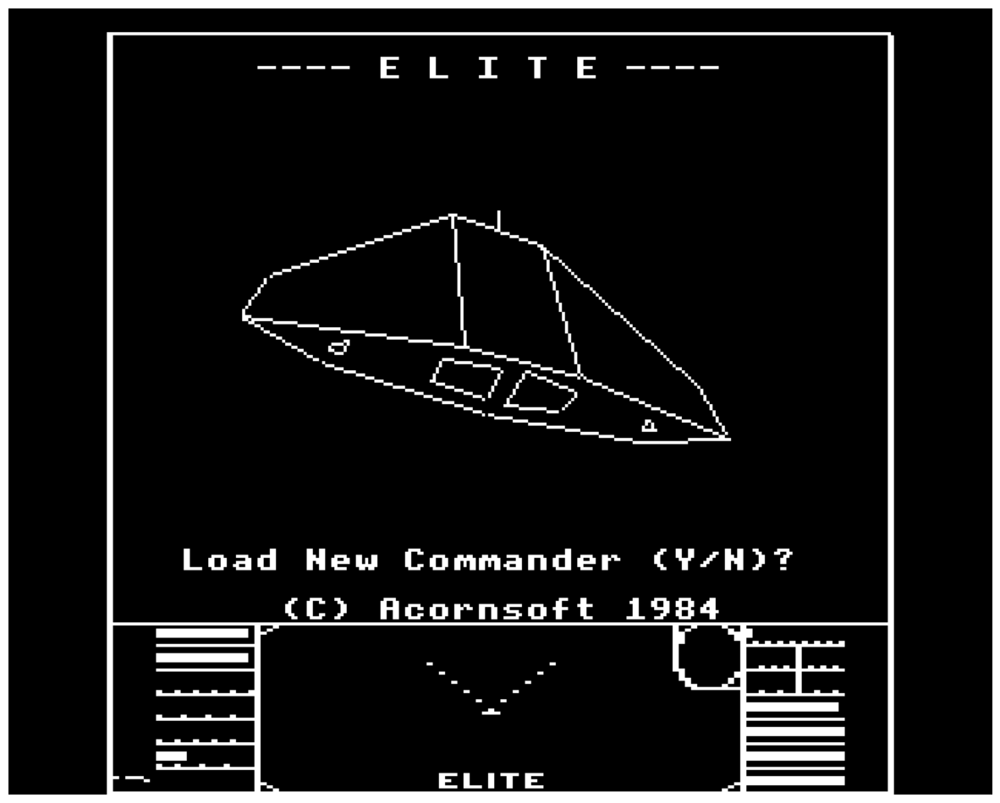

In [ ]:
plot(image[:,:,1]) #plots the image, but this time, only with the green color channel being called

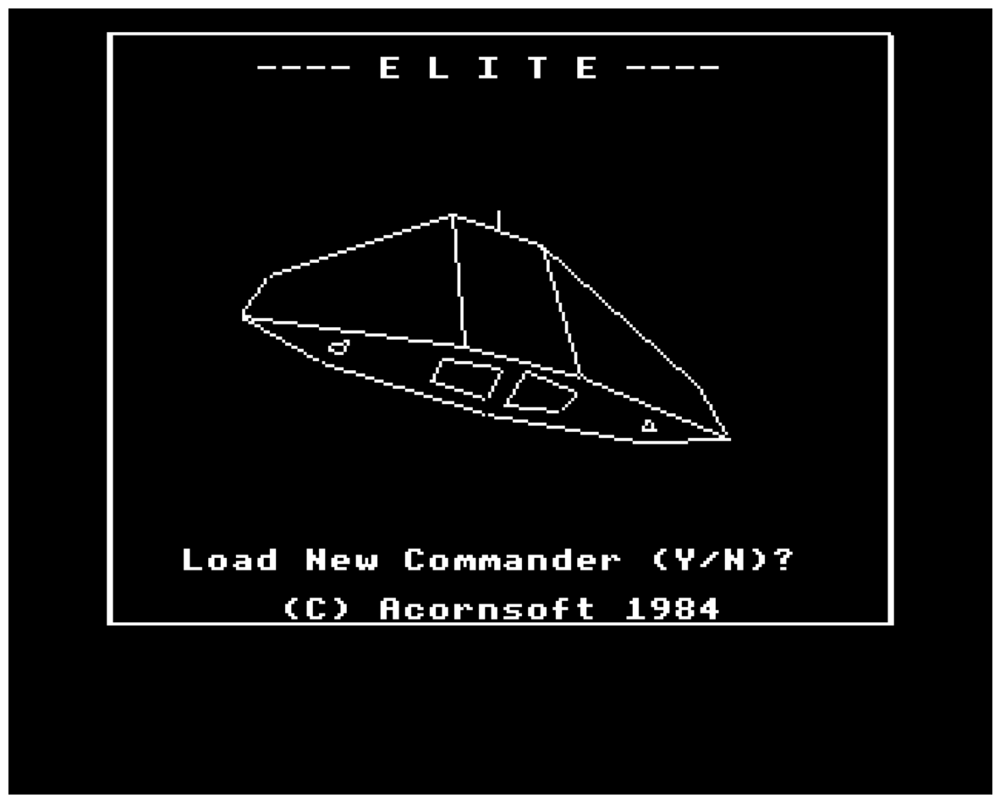

In [ ]:
plot(image[:,:,2]) #plots the image, but this time, only with the blue color channel being called

In [ ]:
image.shape #returns the shape of the image again

(512, 640, 3)

In [ ]:
image = np.mean(image, axis=2) #operation to convert the image to grayscale.  Takes the mean value of the color channels, turning the image to grayscale

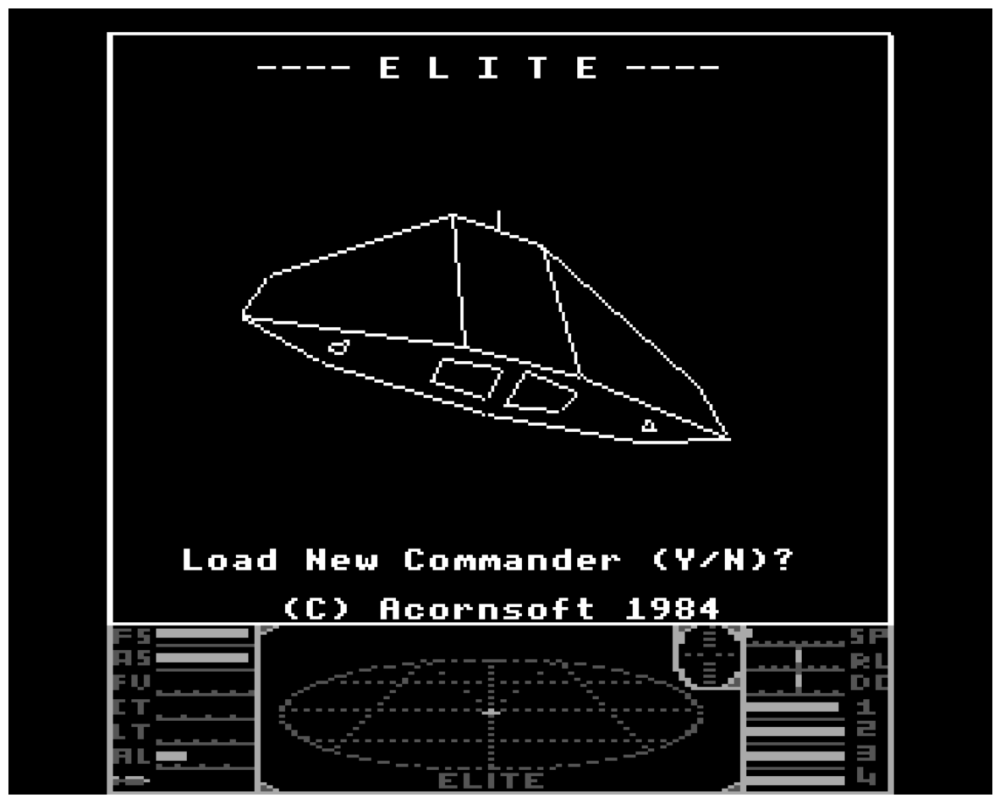

In [ ]:
plot(image) #plots the redefined image

In [ ]:
image.shape #returns the image shape (512x640). Since the image is now in color channel, the color channels are not returned

(512, 640)

In [ ]:
a = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]]) #a is defined as a matrix consisting of values from -2 to 2

In [ ]:
a #prints the matrix a

matrix([[ 1,  2,  1],
        [ 0,  0,  0],
        [-1, -2, -1]])

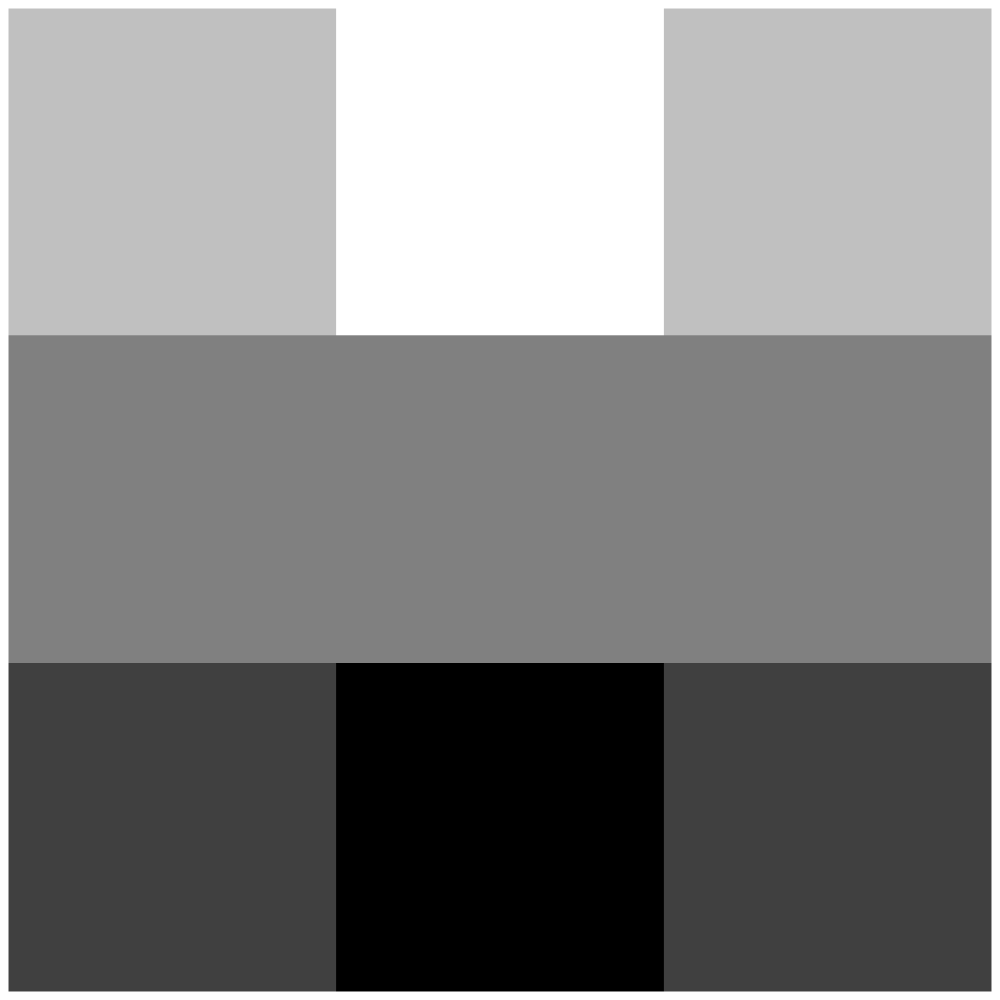

In [ ]:
plot(a) #plots the matrix a (the lower the corresponding value in the matrix, the darker the color in grayscale)

In [ ]:
image.shape #returns the image shape (512x640)

(512, 640)

In [ ]:
y = signal.convolve2d(image, a, mode='same') #using the imported signal, the image is being convolved using matrix a

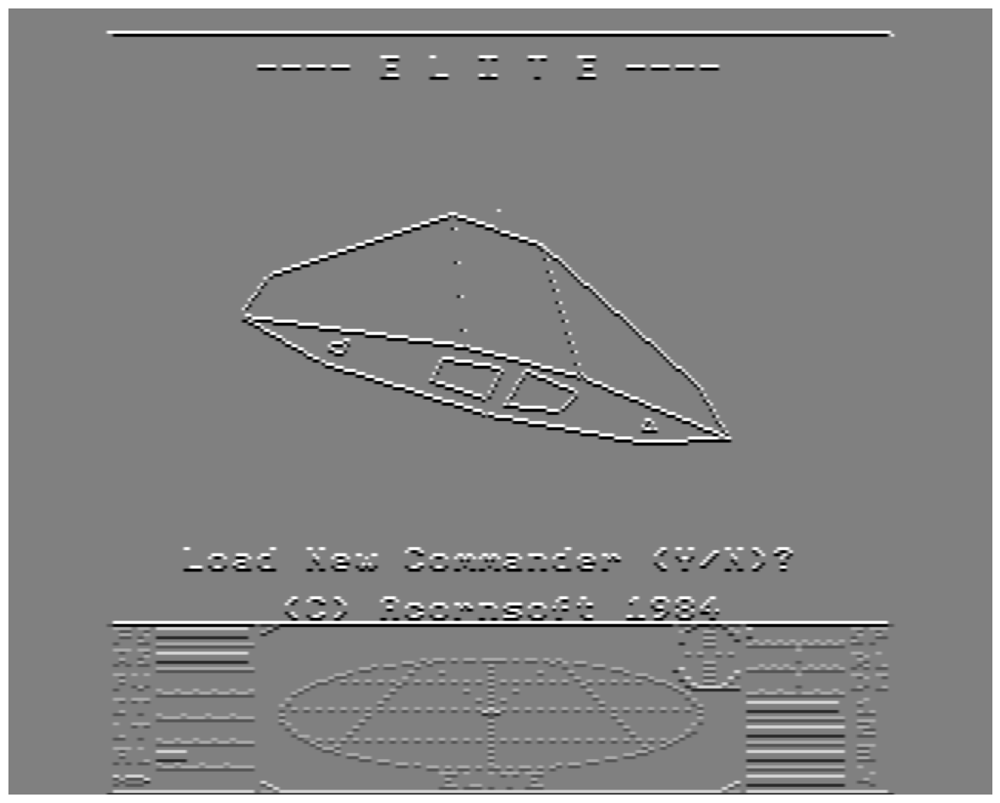

In [ ]:
plot(y) #plots the above defined y

In [ ]:
a = np.transpose(a) #np.transpose will transpose an inputted matrix (columns and rows are swapped)

In [ ]:
a #prints the newly defined a (now transposed)

matrix([[ 1,  0, -1],
        [ 2,  0, -2],
        [ 1,  0, -1]])

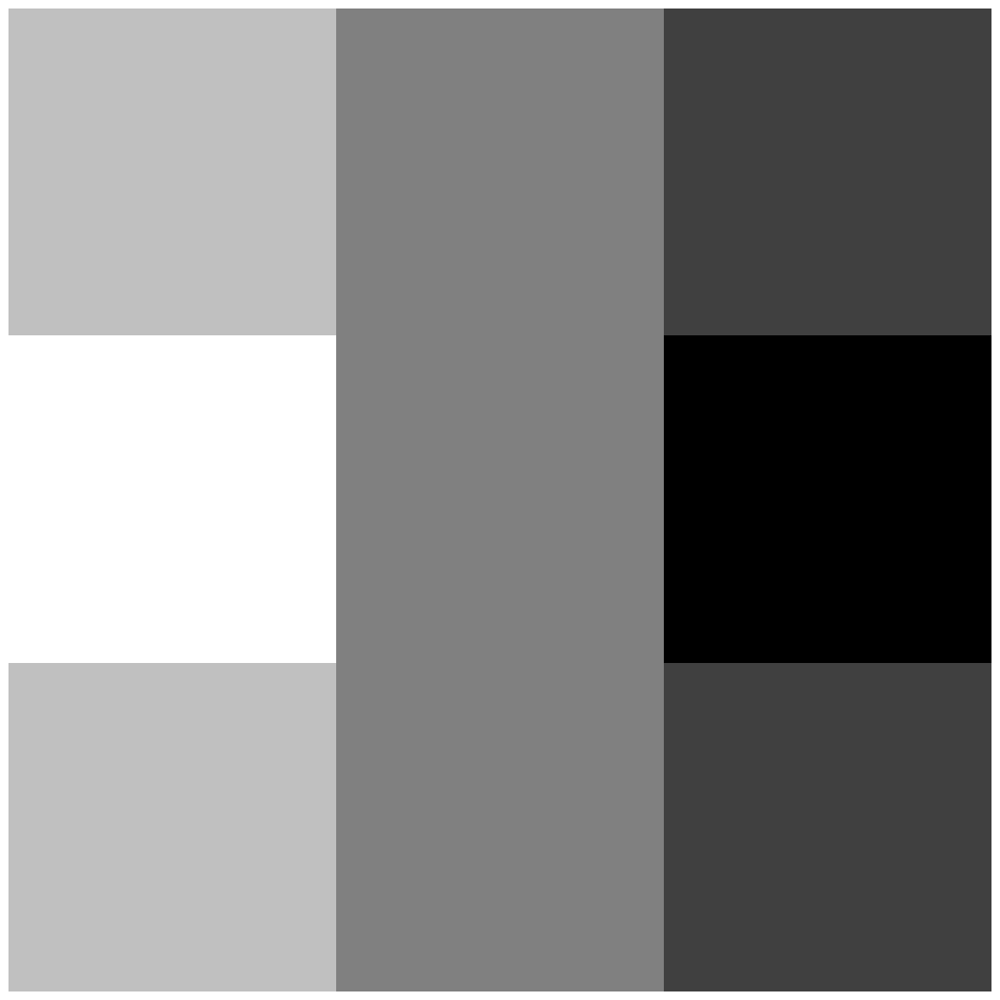

In [ ]:
plot(a) #plots the transposed a

In [ ]:
y = signal.convolve2d(image, a, mode='same') #convolves the image in 2d again

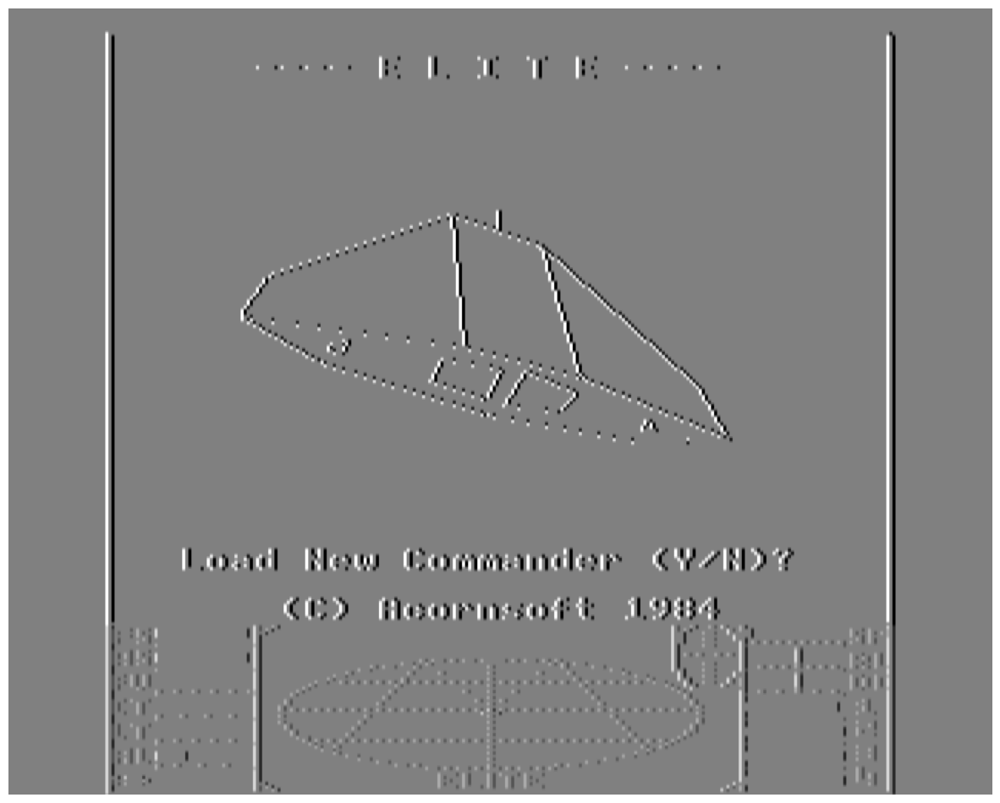

In [ ]:
plot(y) #prints the convolved image

In [ ]:
b = np.random.random((25,25)) #creates a 25x25 array of random numbers between 0 and 1 and defines it as a b

In [ ]:
y = signal.convolve2d(image, b) #since b is a random array, it will have a random filtering effect on the inputted image.

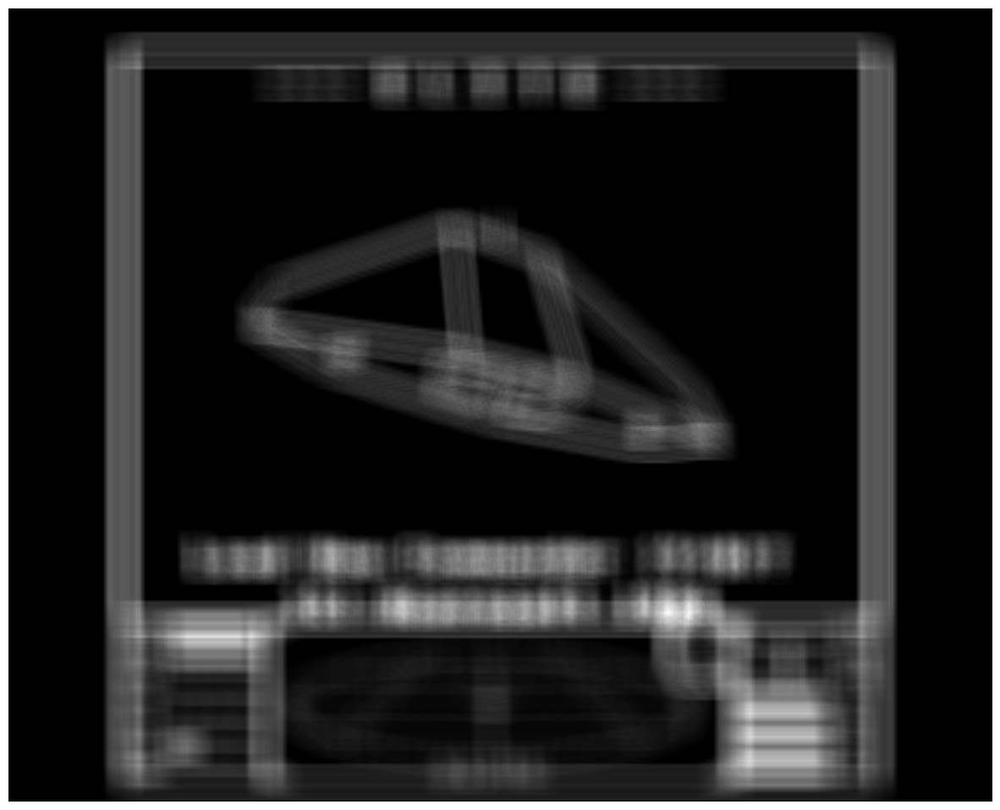

In [ ]:
plot(y) #plots y which is being convolved and filtered by b

In [ ]:
x = io.imread("https://ichef.bbci.co.uk/news/660/cpsprodpb/C342/production/_88068994_thinkstockphotos-493881770.jpg") #x is defined as a reading of a stock photo of a road
x = x[:,:,0] #converts the image to grayscale by only selecting the first color channel

In [ ]:
x = x.astype(float) #turns the elements of x into floats

In [ ]:
x #prints x

array([[100., 100., 100., ..., 168., 170., 164.],
       [100., 100., 100., ..., 169., 168., 168.],
       [101., 101., 101., ..., 170., 166., 169.],
       ...,
       [ 87.,  83.,  76., ...,  84., 125.,  74.],
       [ 52.,  64.,  77., ...,  71., 102.,  79.],
       [ 27.,  45.,  80., ...,  50.,  64.,  68.]])

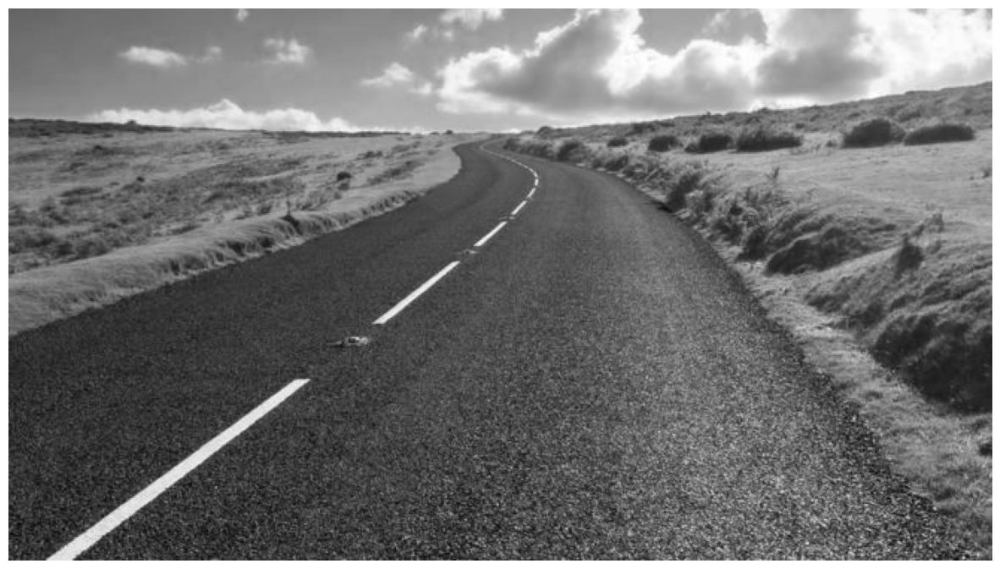

In [ ]:
x = x / 255.0 #divides each value of x by 255
plot(x) #plots x

In [ ]:
x

array([[0.39215686, 0.39215686, 0.39215686, ..., 0.65882353, 0.66666667,
        0.64313725],
       [0.39215686, 0.39215686, 0.39215686, ..., 0.6627451 , 0.65882353,
        0.65882353],
       [0.39607843, 0.39607843, 0.39607843, ..., 0.66666667, 0.65098039,
        0.6627451 ],
       ...,
       [0.34117647, 0.3254902 , 0.29803922, ..., 0.32941176, 0.49019608,
        0.29019608],
       [0.20392157, 0.25098039, 0.30196078, ..., 0.27843137, 0.4       ,
        0.30980392],
       [0.10588235, 0.17647059, 0.31372549, ..., 0.19607843, 0.25098039,
        0.26666667]])

In [ ]:
a #prints the previously defined matrix a

matrix([[ 1,  2,  1],
        [ 0,  0,  0],
        [-1, -2, -1]])

In [ ]:
a[1,1] #prints the value at position 1,1 in matrix a

0

In [ ]:
def conv2(x,f): #this is the code behind a convolution
    x2 = np.zeros(x.shape) #defines x2 as an array of zeros with the same shape as x
    for i in range(1,x.shape[0]-1): #repeats the process by iterating through the number of rows of the array
        for j in range(1,x.shape[1]-1): #similar to the above code, this iterates over the number of columns

            x2[i,j] = f[0,0] * x[i-1,j-1]  \ #by iterating over the rows and columns, this code functions to convolve an inputed image. Each element in the ray is being multiplied by a weight filter
            +         f[0,1] * x[i-1,j]    \
            +         f[0,2] * x[i-1,j+1]  \
            +         f[1,0] * x[i,j-1]    \
            +         f[1,1] * x[i,j]      \
            +         f[1,2] * x[i,j+1]    \
            +         f[2,0] * x[i+1,j-1]  \
            +         f[2,1] * x[i+1,j]    \
            +         f[2,2] * x[i+1,j+1]

    return x2

In [ ]:
a = np.matrix([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]) #defining matrix a
# a = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
# a = np.matrix([[1,1,1],[1,1,1],[1,1,1]])
# a = 5*np.random.random((3,3))-5*np.random.random((3,3))

In [ ]:
a #prints matrix a

matrix([[-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]])

In [ ]:
z = conv2(x,a) #convolves x by using a as a filter. Defined as z

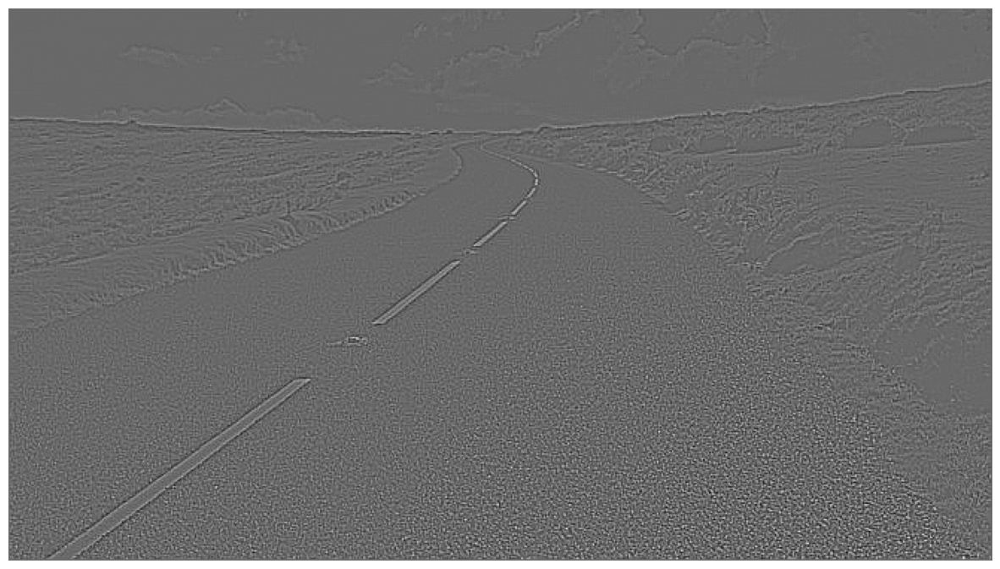

In [ ]:
plot(z) #plots z

[[-0.04523819  0.6779835  -0.54659836]
 [ 0.9425388  -0.27125065 -0.5818917 ]
 [-0.76631726  0.75943424 -0.39929535]]


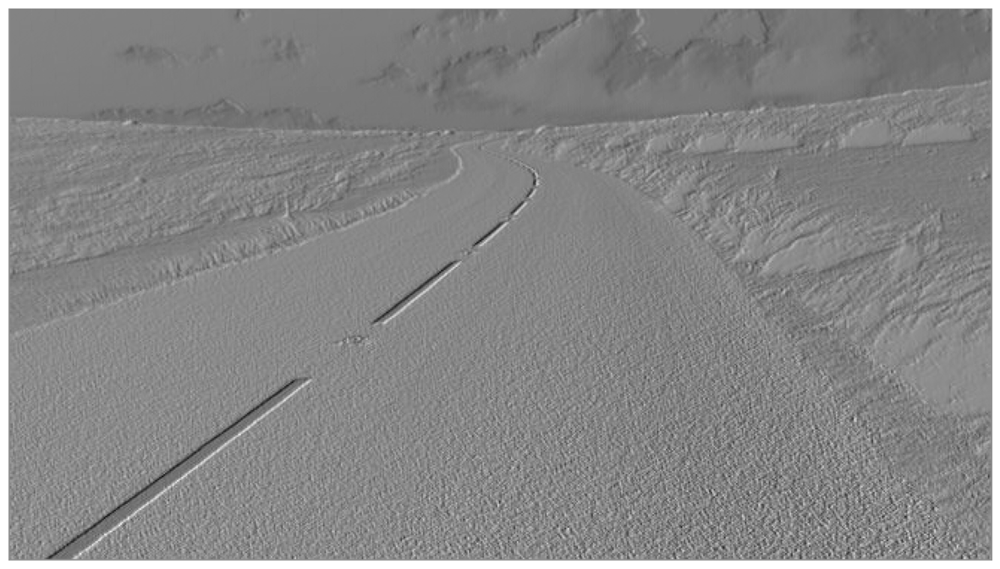

[[-0.02479689 -0.53532392 -0.46730889]
 [ 0.91015189 -0.59119326  0.7761764 ]
 [ 0.3274327  -0.58074327 -0.33232586]]


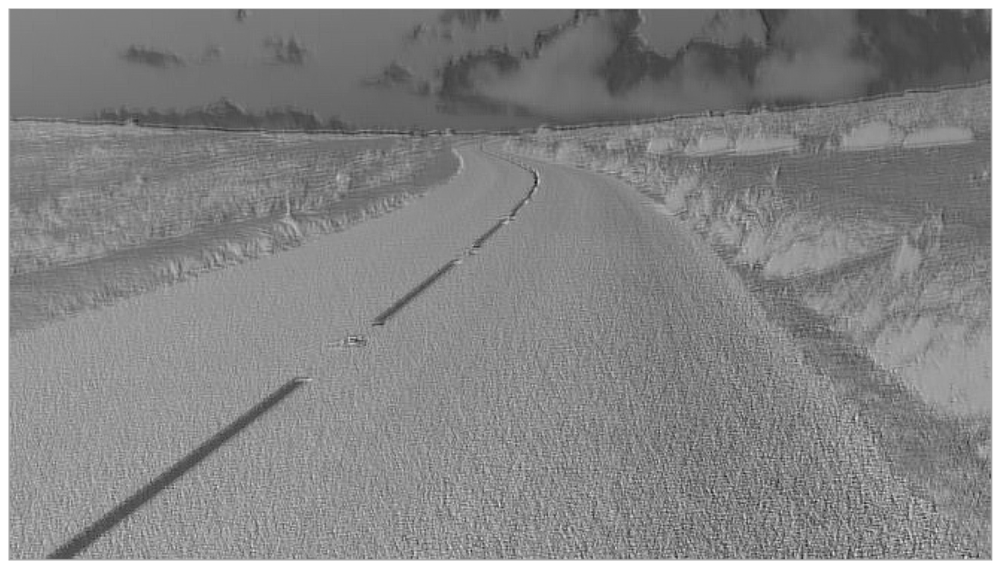

[[-0.35401016  0.36911186  0.42220448]
 [ 0.33997154  0.43290143  0.98147452]
 [ 0.28731338 -0.86415026  0.72798025]]


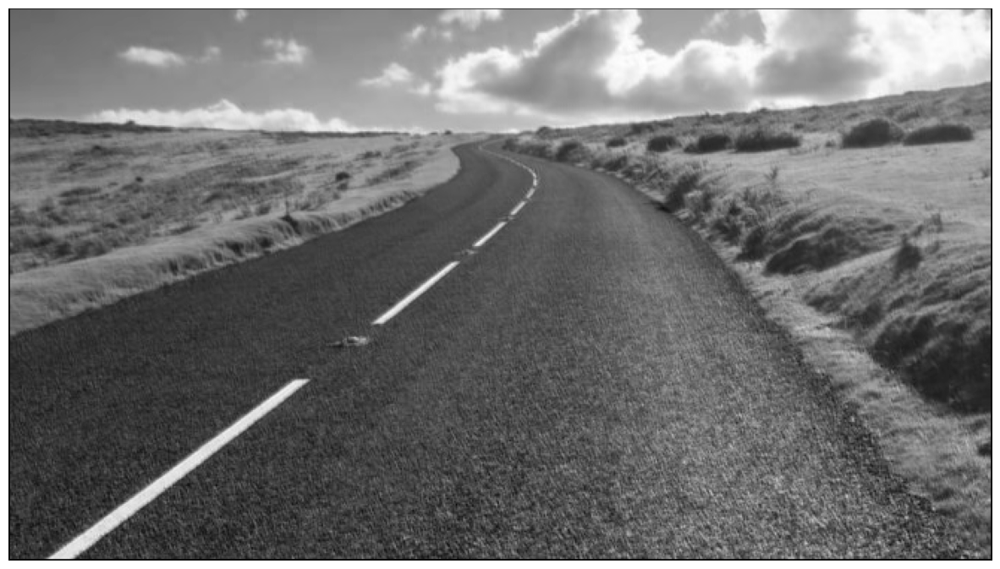

[[ 0.43596616  0.95116844  0.70083434]
 [ 0.14401781 -0.07175277 -0.62780027]
 [-0.0294139  -0.50286673 -0.54594048]]


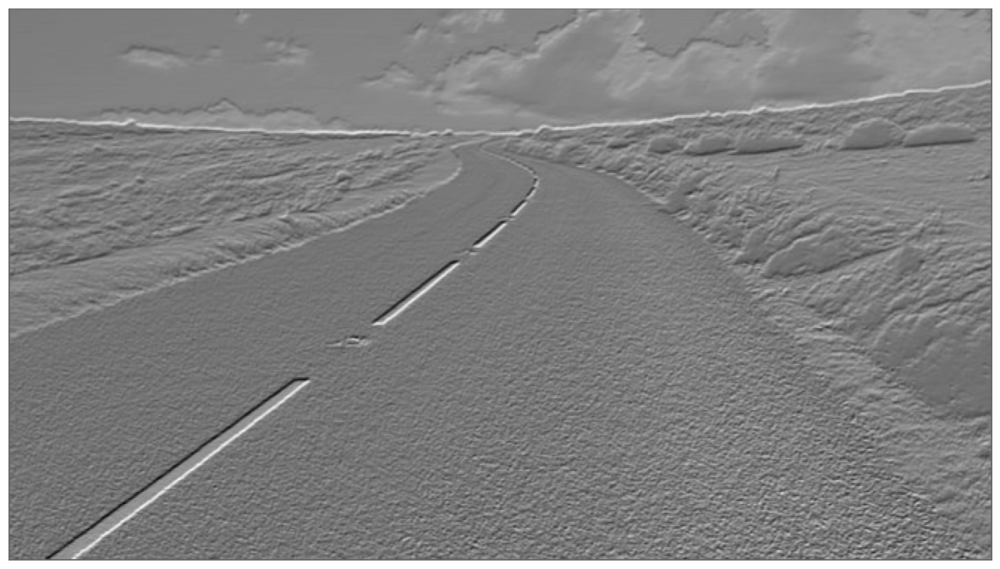

[[-0.79410117  0.24731573  0.09663343]
 [ 0.6484998   0.64345042  0.05191186]
 [ 0.20292688 -0.89487115  0.05904311]]


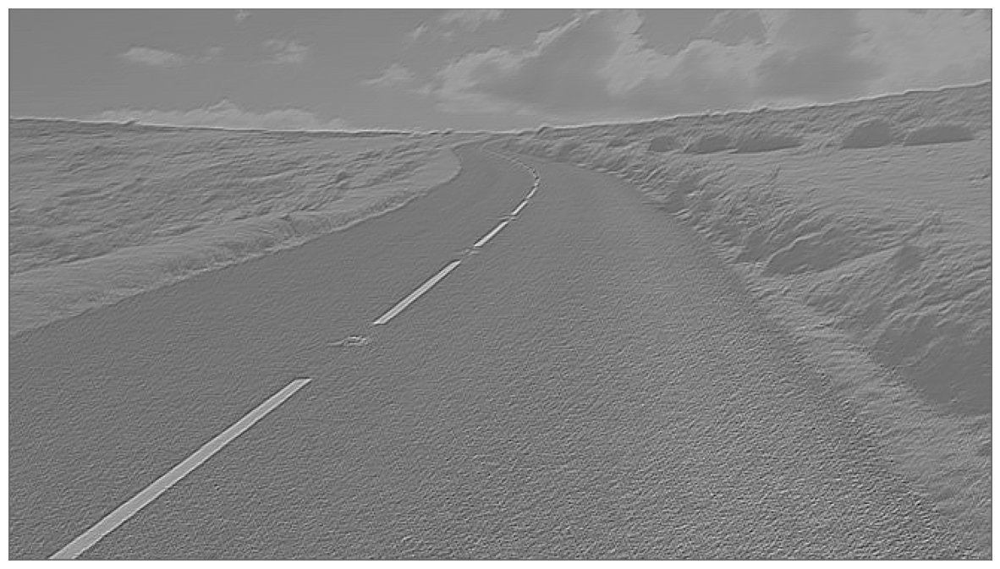

[[ 0.16985487 -0.8745449   0.24170114]
 [-0.54279898  0.07703491 -0.78399457]
 [ 0.80102893 -0.28597592 -0.52012473]]


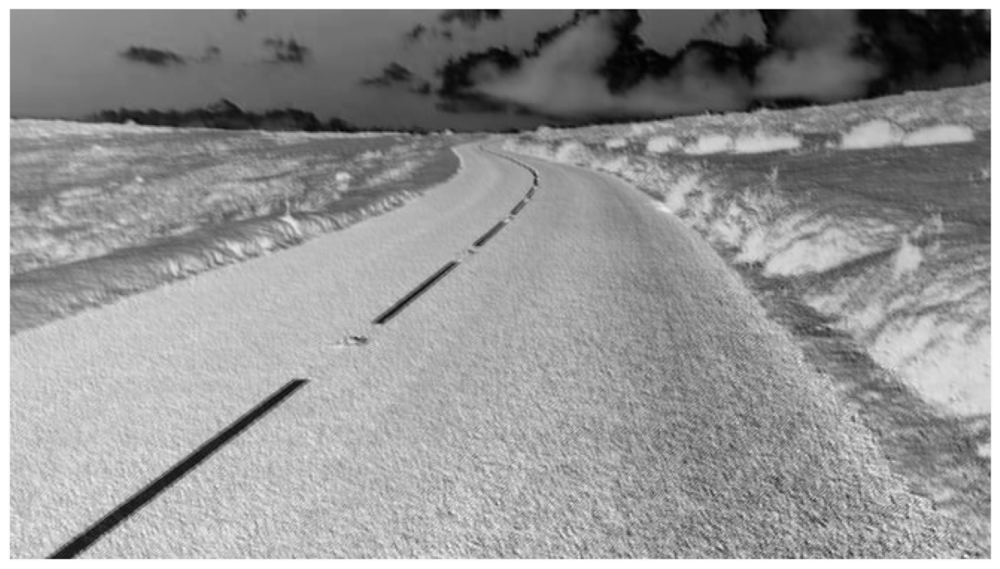

[[-0.28235519  0.38874641 -0.71732456]
 [-0.51892525 -0.24609018  0.21905754]
 [-0.19224885  0.54309049  0.86762597]]


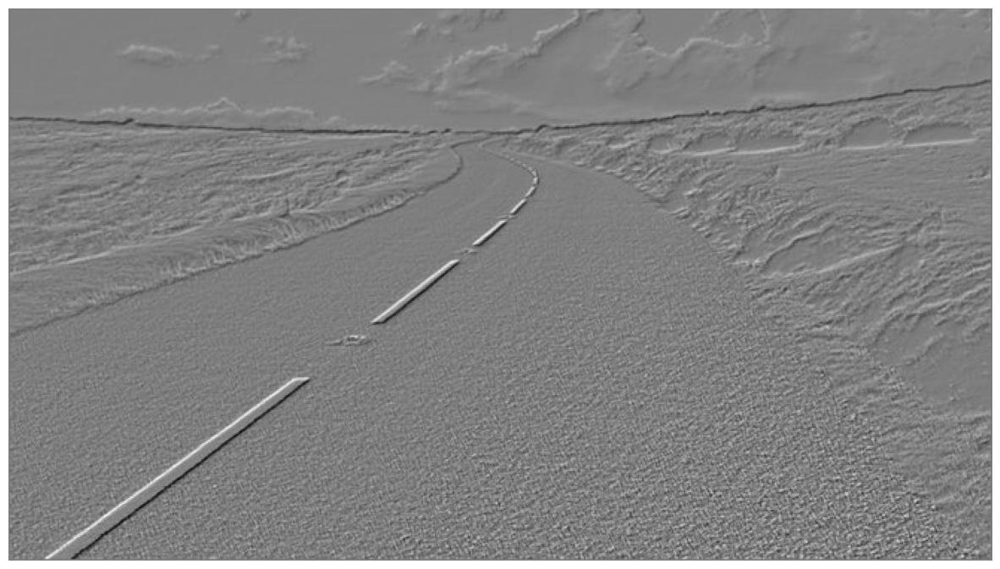

[[ 0.78242013  0.09817945  0.98042777]
 [ 0.79796585  0.0668857   0.10879025]
 [-0.55058504 -0.56732998  0.08407163]]


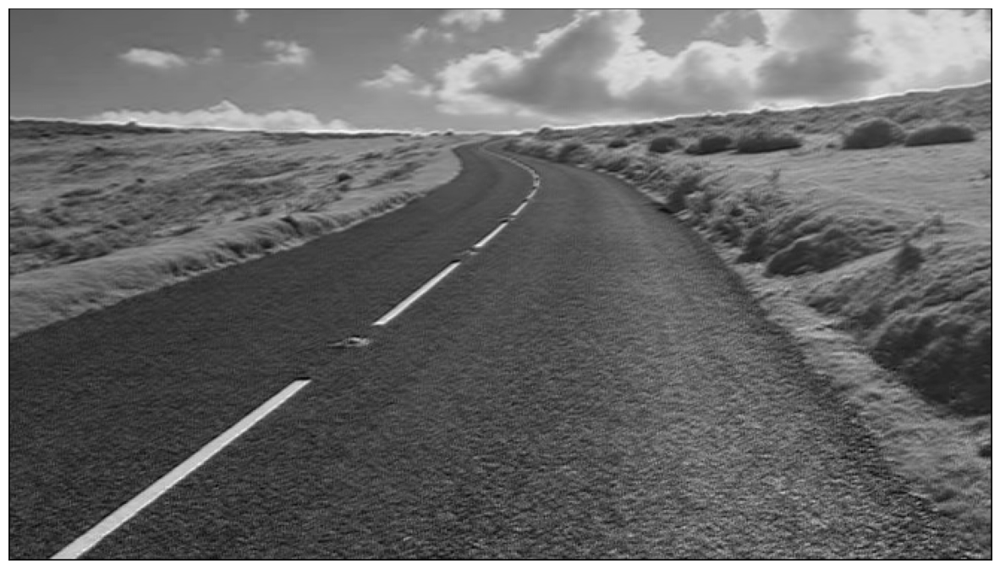

[[-0.19981806 -0.71932053  0.06863662]
 [ 0.07943013 -0.37626198  0.93652297]
 [-0.9914183  -0.74200061 -0.89334464]]


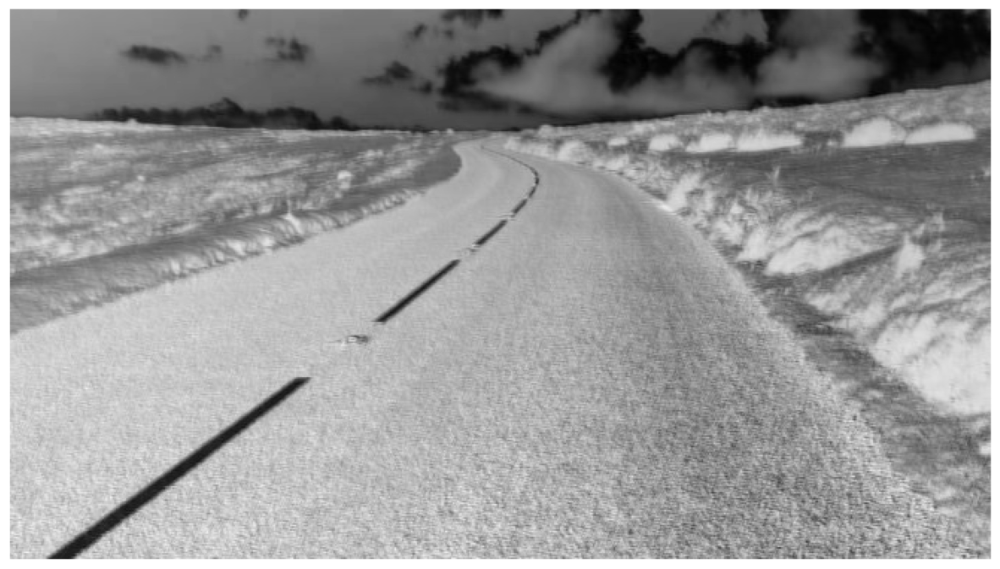

[[ 0.10396243  0.49206305 -0.4784392 ]
 [-0.40561381  0.76406454  0.5128336 ]
 [-0.20896514  0.8648078  -0.74350822]]


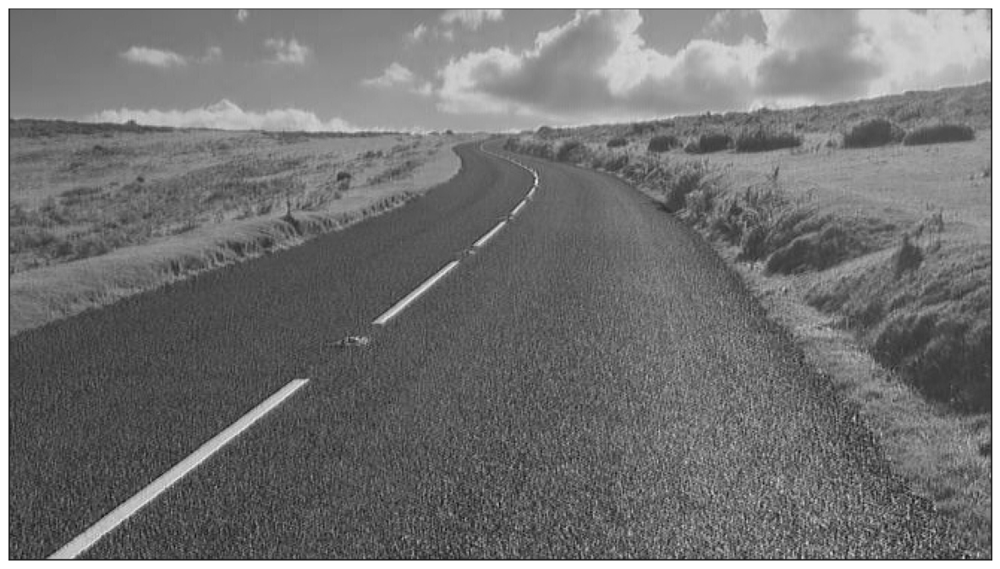

In [ ]:
for i in range(10): #repeats the process 10 times
    a = 2*np.random.random((3,3))-1 #a is defined as an array of random numbers multiplied by 2 and subtracted by 1 (3x3 array)
    print(a) #prints the output of a
    z=conv2(x,a) #convolves z by the random filter a
    plot(z) #plots z 10 times with a random filter each time

In [ ]:
#Homemade Conv Loop Timing
a = 2*np.random.random((9,3,3))-1 #creating a random filter a again
start_time = time.time() #records the current time
for i in range(9): #repeats the process for 9 times

    z=conv2(x,a[i,:,:]) #convolves z using the random a filter

print("Seconds:", (time.time() - start_time)) #prints the time the process took by subtracting the current time by the start time (takes around 8 seconds)

Seconds: 8.46601152420044


In [ ]:
#Optimized Code Timing (this code will make the process much faster)
a = 2*np.random.random((9,3,3))-1 #creating a random filter
start_time = time.time() #records the current time
for i in range(9): #repeats the process for 9 times

    z = signal.convolve2d(x,a[i,:,:]) #convolves z using the random a filter

print("--- %s seconds ---" % (time.time() - start_time)) #prints the time the process took by subtracting the current time by the start times (takes around 0.1 second)

--- 0.10261416435241699 seconds ---


In [ ]:
#GPU Processing Timing, No Loop, 96 filters!!
a2 = 2*np.random.random((96,1,3,3))-1 #generates random filter a2
x2 = torch.tensor(x).cuda() #converting x2 into a tensor and then storing it in the gpu
a2 = torch.tensor(a2).cuda() #converting a2 into a tensor and then storing it in the gpu
x2 = x2[None,None,:,:] #adds 2 more dimensions to the x2 tensor

start_time = time.time() #records the current time
z = conv2d(x2,a2) #convolves the tensor x2 by the tensor filter a2
print("--- %s seconds ---" % (time.time() - start_time)) #prints the time the process took (half a second roughly)

--- 0.5753672122955322 seconds ---


In [ ]:
z.shape #prints the shape of the array z

torch.Size([1, 96, 369, 658])

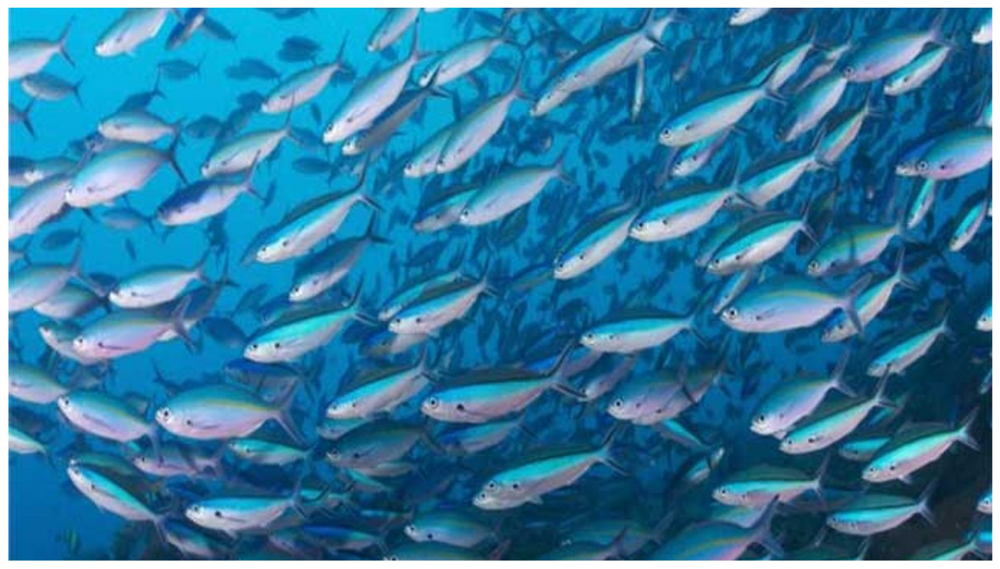

In [ ]:
image = io.imread("https://img.jagranjosh.com/imported/images/E/Articles/Fastest-Fish-img.jpg").astype(float)/255.0 #interprets the image as a float and then divides by 255 for the purposes of manipulating the image
plot(image) #plots the url image

In [ ]:
image.shape #returns the shape of the above image

(675, 1200, 3)

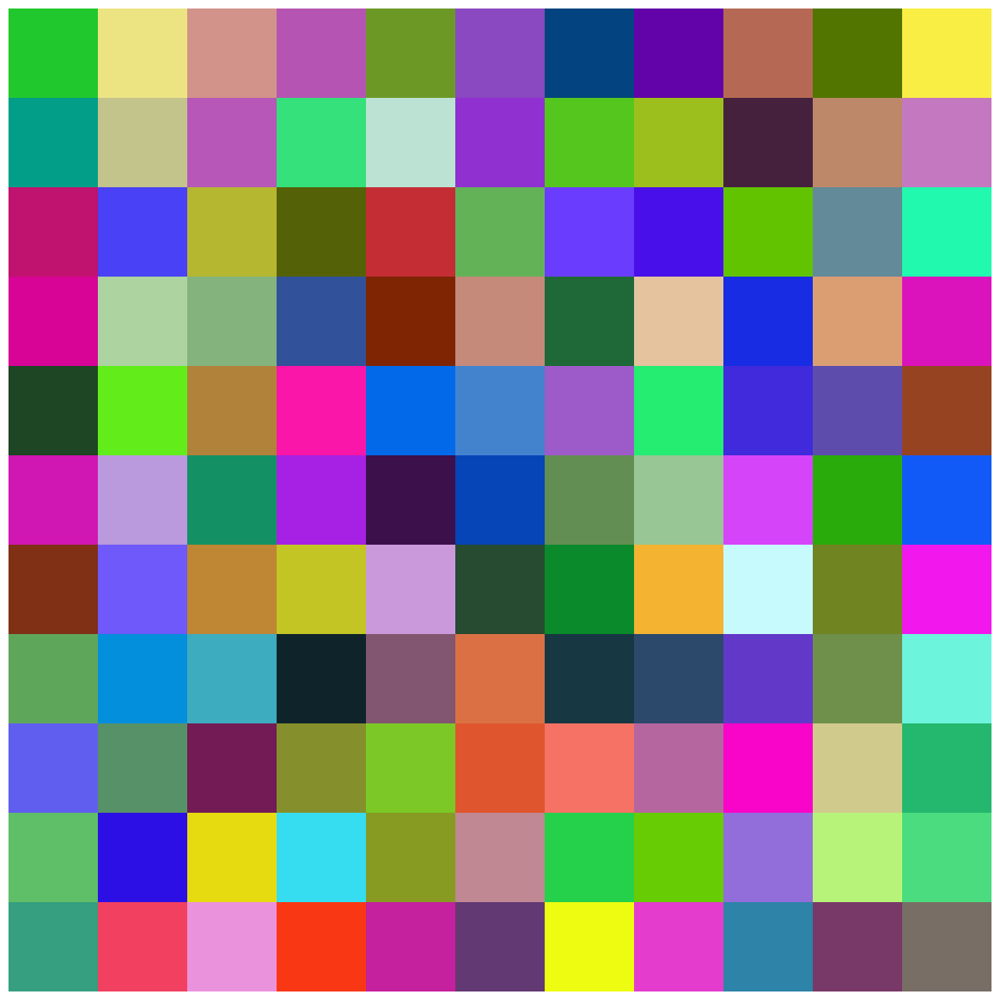

In [ ]:
plot(np.random.random((11,11,3))) #plots a random grid of colors with 3 color channels using random numbers

In [ ]:
image = np.transpose(image, (2, 0, 1)) #third axis becomes first, second axis becomes first, third axis becomes second

In [ ]:
image.shape #prints the shape of the transposed image

(3, 675, 1200)

In [ ]:
f = np.random.random((1,3,11,11)) #creates a large of array of iniformly distributed random numbers (between 0 and 1)

In [ ]:
image.shape #prints the shape of the transposed image again

(3, 675, 1200)

In [ ]:
image = image[None,:,:,:] #adds a new dimension to the image array

In [ ]:
image.shape,f.shape #prints the new shape of image (extra dimension), and the shape of f

((1, 3, 675, 1200), (1, 3, 11, 11))

In [ ]:
f =  torch.tensor(f) #converts f into a tensor
image =  torch.tensor(image) #converts the image into a tensor

In [ ]:
image2 = F.conv2d(image,f) #convolves the image with the filter f, defines the convolution as image2

In [ ]:
image2 = image2.numpy() #takes the tensor image2 and converts back into an array

In [ ]:
image2.shape #prints the shape of the array

(1, 1, 665, 1190)

In [ ]:
image2[0,0,:,:].shape #prints the shape of the first element of the first channel of the array

(665, 1190)

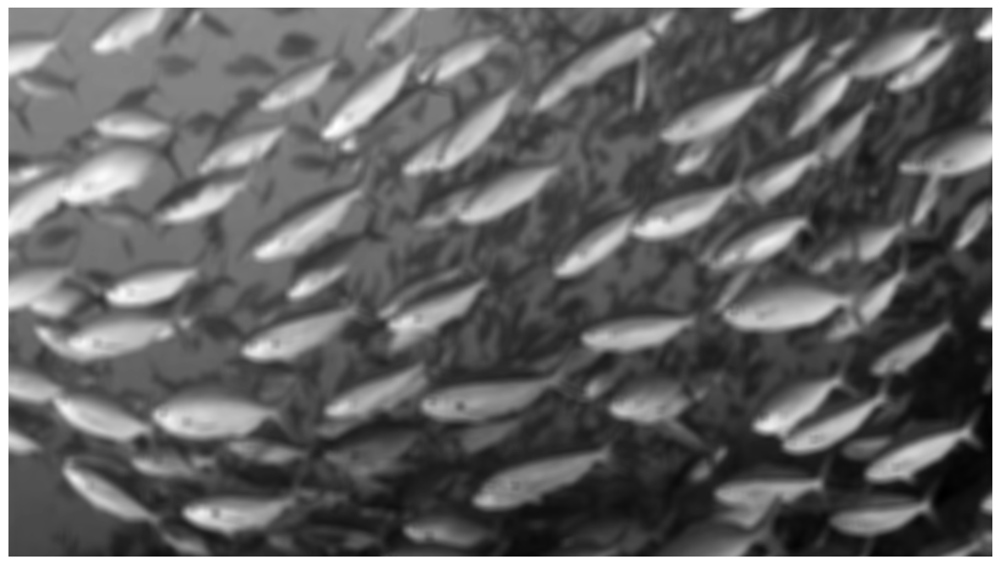

In [ ]:
plot(image2[0,0,:,:]) #plots image 2 using the the first channel of the array as a color scale

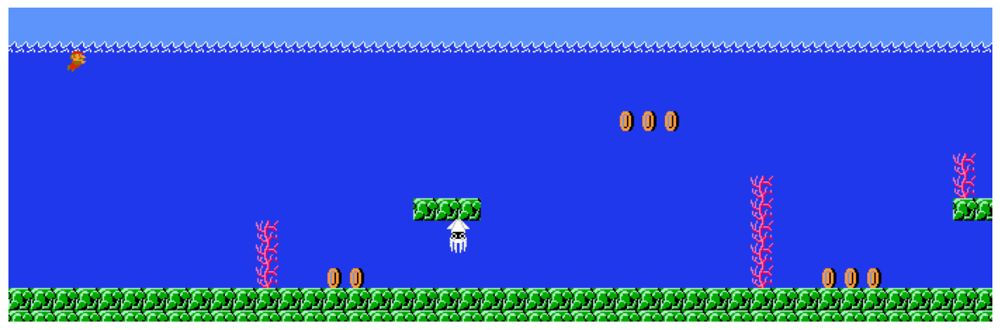

In [ ]:
image = io.imread("http://ian-albert.com/games/super_mario_bros_maps/mario-2-2.gif") #reads the url image
image = image[:,0:700,:] #"slicing" operation. Limits the image to 700 pixels in height
plot(image) #plots the image

In [ ]:
coin = image[185:200,224:239,:] #coin is defined as the the coordinates of one of the coins in the image cropped so only the coin is shown

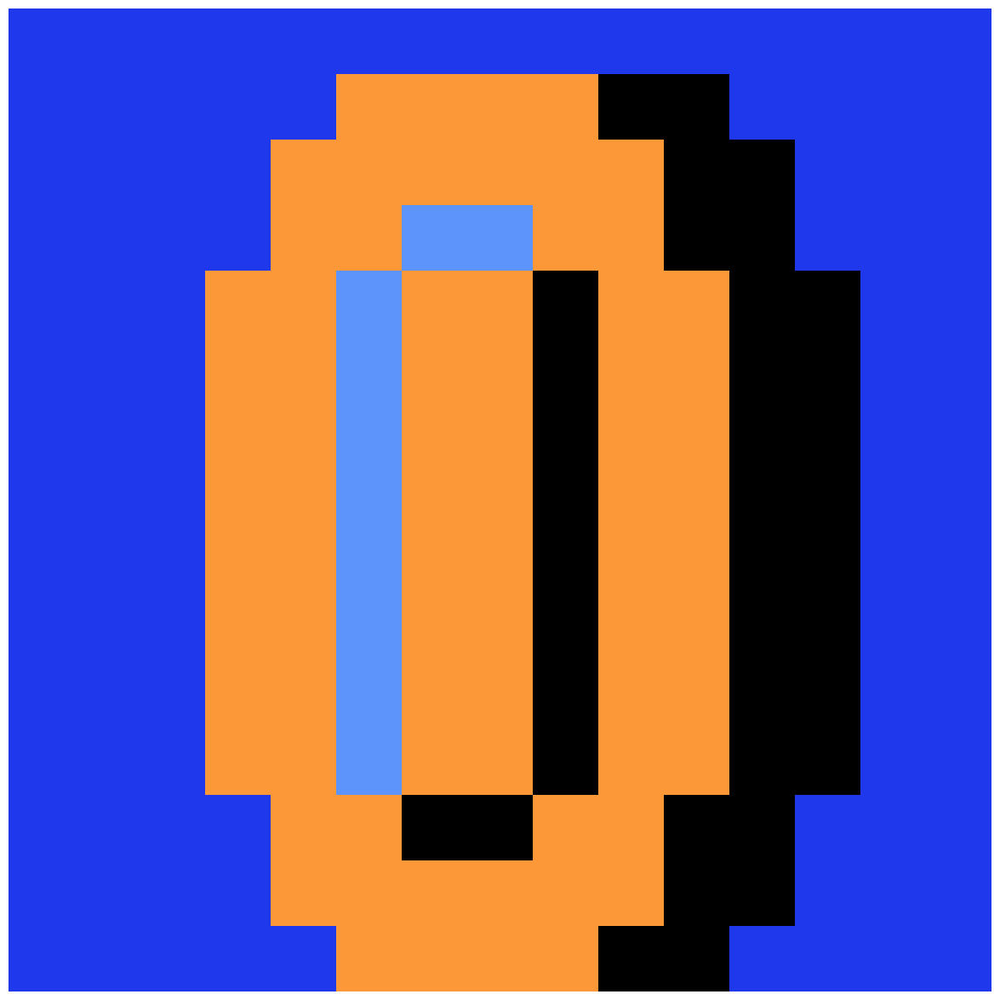

In [ ]:
plot(coin) #plots the image of the selected coin

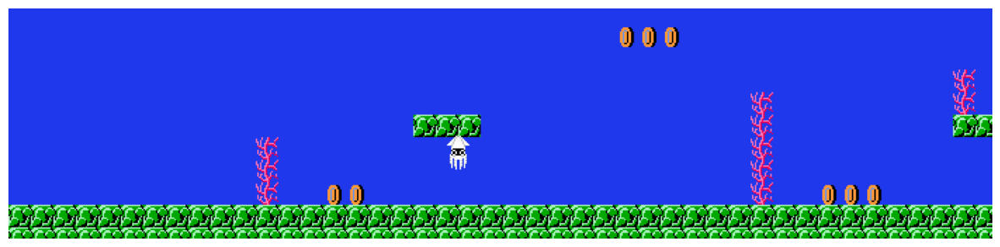

In [ ]:
image = image[60:,0:700,:] #crops the image to 700 in height and 60 in length
plot(image) #plots the cropped image

In [ ]:
def scale1(x): #scaling function
    return (x-np.min(x))/(np.max(x)-np.min(x)) #subtracts x by the minimum value of the array and divides it by the maximum value minus the minimum value. Smallest value is now 0 and largest value is 1

In [ ]:
image = np.mean(image,axis=2) #operation that makes the image grayscale
coin = np.mean(coin,axis=2) #operation that makes the coin grayscale

image = scale1(image) #using the created scale1 function, the image is scaled between 0 and 1
coin = scale1(coin) #using the created scale1 function, the coin is scaled between 0 and 1

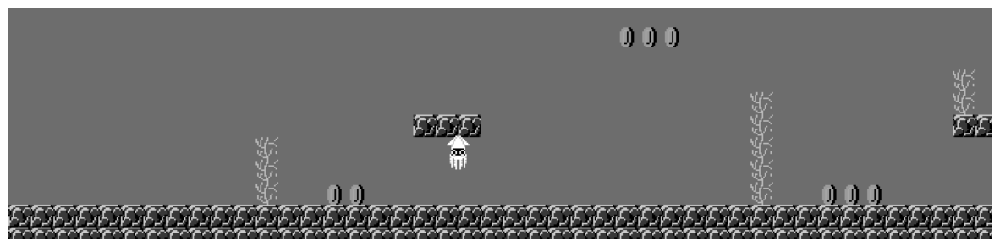

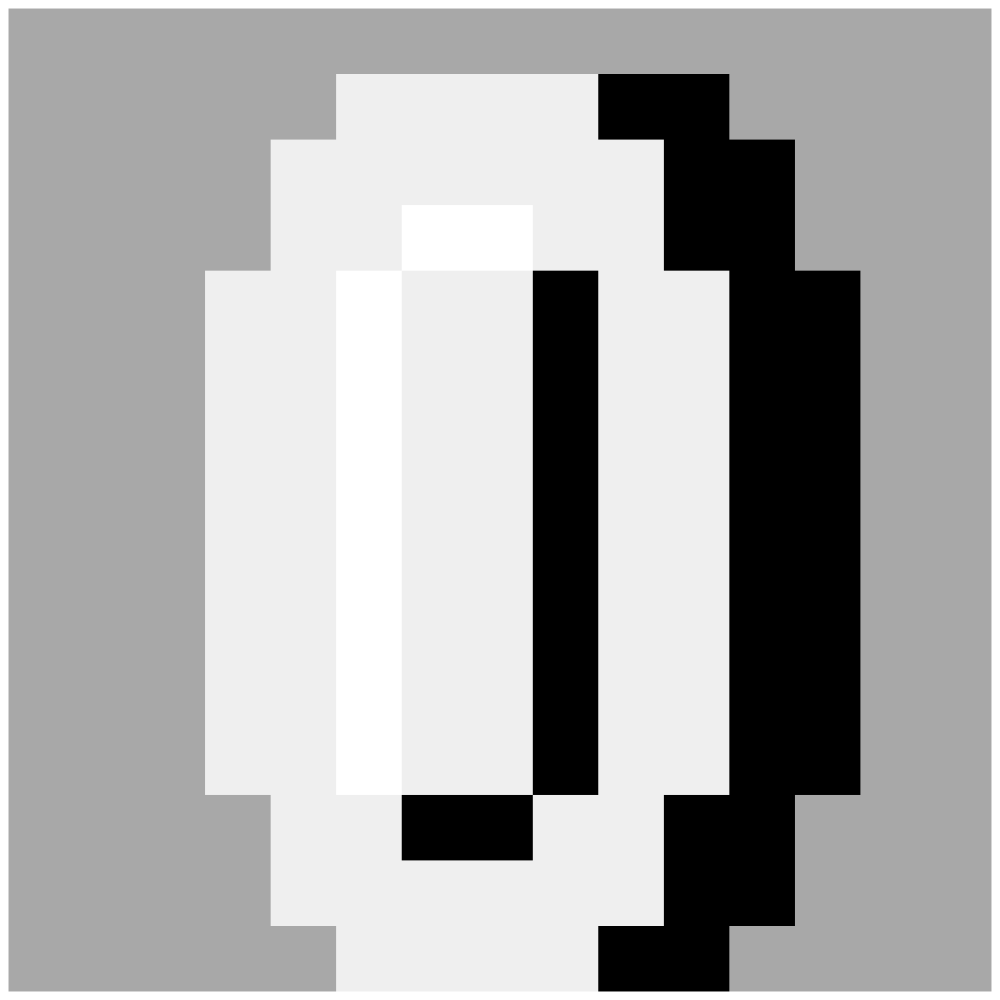

In [ ]:
plot(image) #plots the scaled grayscale image
plot(coin) #plots the scaled grayscale coin

In [ ]:
coin.shape #prints the shape of the coin image

(15, 15)

In [ ]:
image = image - np.mean(image) #image is defined as the values of image subtracted by the mean value of image
coin = coin - np.mean(coin) #coin is defined as the values of coin substracted by the mean value of coin

In [ ]:
image.shape,coin.shape #prints the shape of image and coin again

((164, 700), (15, 15))

In [ ]:
coin = np.rot90(coin, 2) #np.rot rotates the coin by 90 degrees. The 2 means that it should rotated 90 degrees twice (180)

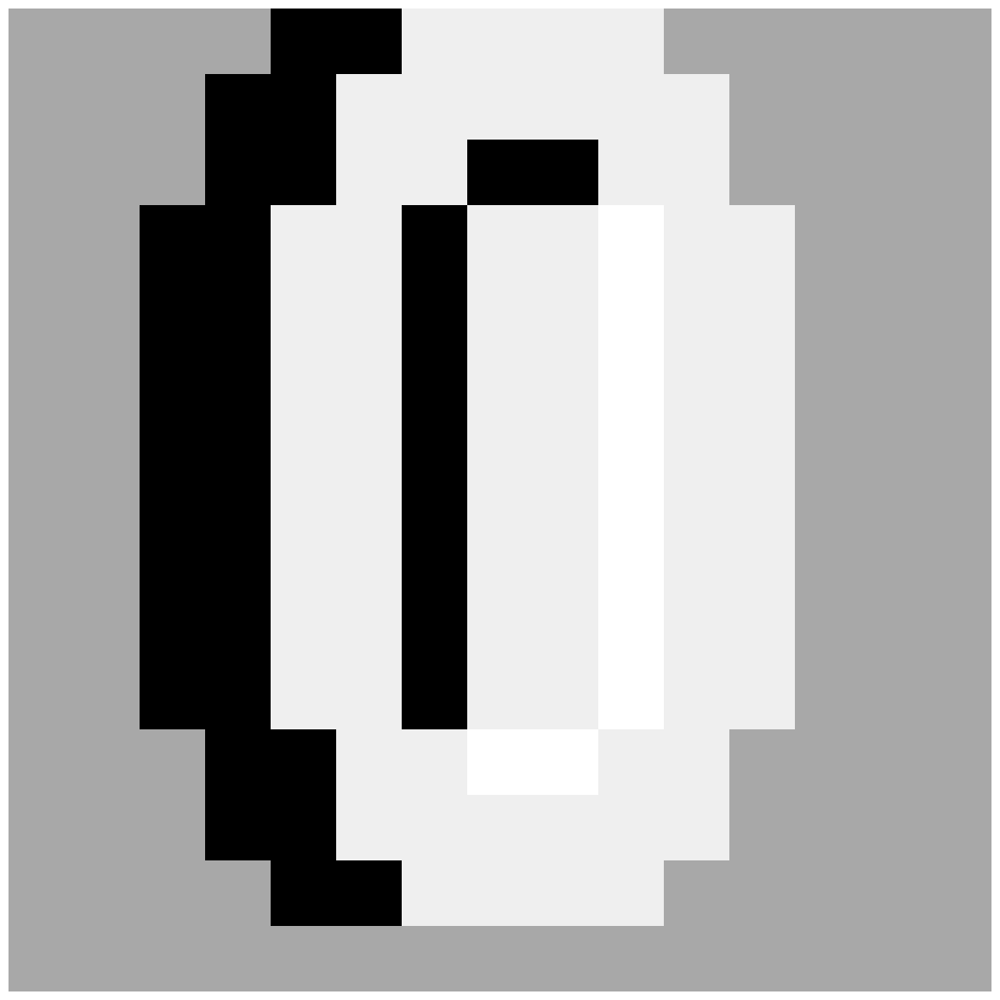

In [ ]:
plot(coin) #plots the coin that has been rotated 180 degrees

In [ ]:
z = signal.convolve2d(image,coin) #convolves the image using the coin as a filter. Convolution is defined as z

In [ ]:
# z = conv2(image,coin)

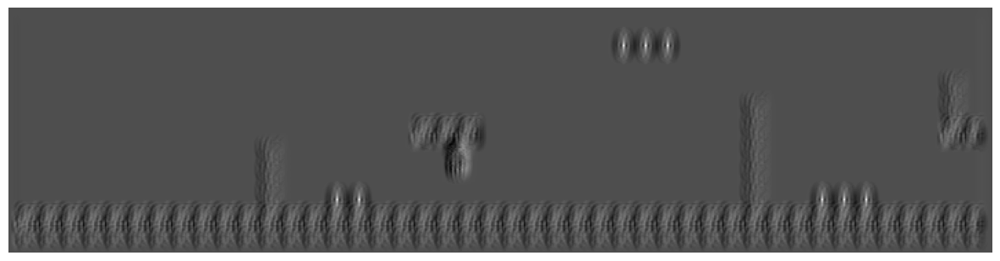

In [ ]:
plot(z) #Plots the convolved image (z)

In [ ]:
z == np.max(z) #searching in the image for where the maximum value of z is found (location of the coins)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

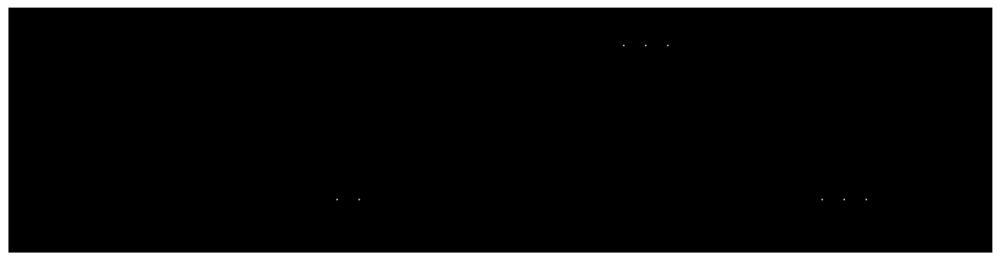

In [ ]:
plot(z==np.max(z)) #plots the areas where the max values are (coins)

In [ ]:
np.where(z == np.amax(z)) #returns the location of the maximum values of z

(array([ 27,  27,  27, 139, 139, 139, 139, 139]),
 array([446, 462, 478, 238, 254, 590, 606, 622]))

In [ ]:
[y,x] = np.where(z == np.amax(z)) #defines y,x as a list of the values of the locations of the maximum values of z

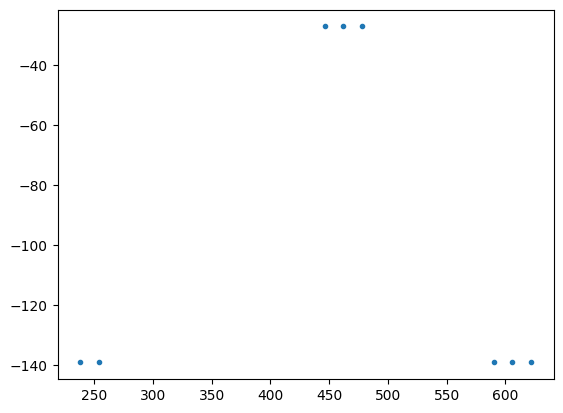

In [ ]:
plt.plot(x,-y,'.') #plots the location of the coins with dots on an actual plot

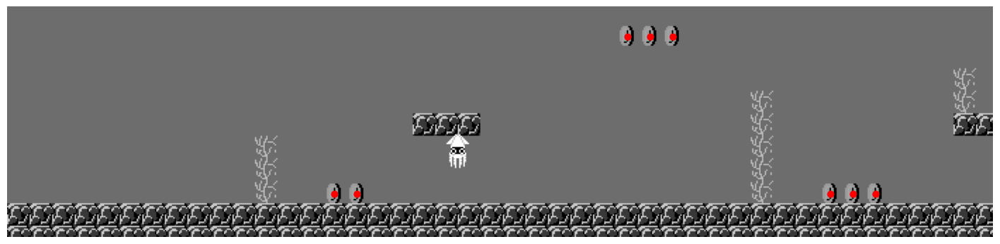

In [ ]:
fig, ax = plt.subplots() #plots a figure with subplots
im = ax.imshow(image, cmap = 'gray') #plots the image in grayscale
ax.axis('off') #turns the x axis off
ax.scatter(x-6, y-6, c='red', s=40) #plots the location of the coins as red dots on top of the grayscale image
fig.set_size_inches(18, 10) #sets the size of the figure to 18x10

In [ ]:
def conv2(w,f): #GPU conv with padding (defining new convolutoin function)

    n = conv2d(w.type(torch.int),f.type(torch.int)) #converts w and f into tensors
    n = pad(n, (1, 1, 1, 1)) #add ones to the sides of the matrix

    return n #returns the value of n